In [ ]:

# # IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# # TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# # THEN FEEL FREE TO DELETE THIS CELL.
# # NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# # ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# # NOTEBOOK.

# import os
# import sys
# from tempfile import NamedTemporaryFile
# from urllib.request import urlopen
# from urllib.parse import unquote, urlparse
# from urllib.error import HTTPError
# from zipfile import ZipFile
# import tarfile
# import shutil

# CHUNK_SIZE = 40960
# DATA_SOURCE_MAPPING = 'dl-a5-data:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4891196%2F8244595%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240427%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240427T120724Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D6a3816b3d48e7d5edb3cf8a77807c18c838bb7afa3db50b70f97ea92f0fd9b523ae8df6de239e46d9087a1af4bcc53fbd76bcafe13e817d8b145be08050d95071928add94265be1c21b2b419367d1d7fa6e3fed379af9eb8a49f189180654bb815a8b20d2b07c96e56ef02ec418e1b3bb40a24dd8fcfa76fcd5208946a96baeb349182b1ba4e4e48a768547d71725753a52e35c5211a17d1b185c5a3f46cf5d04a46a1e61b5a43866520cf4a5aab5db0cfc671dfc5220f798e2d2544f458e48a585c9a4790e32c75172d7f742307ce34ed0242faca29f08ca11333a5006488fad0afa720127eb0ca6f90bfff36f908ae0bcb409c83a91ccac8e1490d1f83bb11'

# KAGGLE_INPUT_PATH='/kaggle/input'
# KAGGLE_WORKING_PATH='/kaggle/working'
# KAGGLE_SYMLINK='kaggle'

# !umount /kaggle/input/ 2> /dev/null
# shutil.rmtree('/kaggle/input', ignore_errors=True)
# os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
# os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

# try:
#   os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
# except FileExistsError:
#   pass
# try:
#   os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
# except FileExistsError:
#   pass

# for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
#     directory, download_url_encoded = data_source_mapping.split(':')
#     download_url = unquote(download_url_encoded)
#     filename = urlparse(download_url).path
#     destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
#     try:
#         with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
#             total_length = fileres.headers['content-length']
#             print(f'Downloading {directory}, {total_length} bytes compressed')
#             dl = 0
#             data = fileres.read(CHUNK_SIZE)
#             while len(data) > 0:
#                 dl += len(data)
#                 tfile.write(data)
#                 done = int(50 * dl / int(total_length))
#                 sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
#                 sys.stdout.flush()
#                 data = fileres.read(CHUNK_SIZE)
#             if filename.endswith('.zip'):
#               with ZipFile(tfile) as zfile:
#                 zfile.extractall(destination_path)
#             else:
#               with tarfile.open(tfile.name) as tarfile:
#                 tarfile.extractall(destination_path)
#             print(f'\nDownloaded and uncompressed: {directory}')
#     except HTTPError as e:
#         print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
#         continue
#     except OSError as e:
#         print(f'Failed to load {download_url} to path {destination_path}')
#         continue

# print('Data source import complete.')


[==================================================] 2771611263 bytes downloaded
Downloaded and uncompressed: dl-a5-data
Data source import complete.


In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


# [VQ-VAE](https://arxiv.org/abs/1711.00937) by  [Aäron van den Oord](https://twitter.com/avdnoord) et al. in PyTorch

## Introduction

Variational Auto Encoders (VAEs) can be thought of as what all but the last layer of a neural network is doing, namely feature extraction or seperating out the data. Thus given some data we can think of using a neural network for representation generation.

Recall that the goal of a generative model is to estimate the probability distribution of high dimensional data such as images, videos, audio or even text by learning the underlying structure in the data as well as the dependencies between the different elements of the data. This is very useful since we can then use this representation to generate new data with similar properties. This way we can also learn useful features from the data in an unsupervised fashion.

The VQ-VAE uses a discrete latent representation mostly because many important real-world objects are discrete. For example in images we might have categories like "Cat", "Car", etc. and it might not make sense to interpolate between these categories. Discrete representations are also easier to model since each category has a single value whereas if we had a continous latent space then we will need to normalize this density function and learn the dependencies between the different variables which could be very complex.

### Code

I have followed the code from the TensorFlow implementation by the author which you can find here [vqvae.py](https://github.com/deepmind/sonnet/blob/master/sonnet/python/modules/nets/vqvae.py) and [vqvae_example.ipynb](https://github.com/deepmind/sonnet/blob/master/sonnet/examples/vqvae_example.ipynb).

Another PyTorch implementation is found at [pytorch-vqvae](https://github.com/ritheshkumar95/pytorch-vqvae).


## Basic Idea

The overall architecture is summarized in the diagram below:

![](https://github.com/zalandoresearch/pytorch-vq-vae/blob/master/images/vq-vae.png?raw=1)

We start by defining a latent embedding space of dimension `[K, D]` where `K` are the number of embeddings and `D` is the dimensionality of each latent embeddng vector, i.e. $e_i \in \mathbb{R}^{D}$. The model is comprised of an encoder and a decoder. The encoder will map the input to a sequence of discrete latent variables, whereas the decoder will try to reconstruct the input from these latent sequences.

More preciesly, the model will take in batches of RGB images,  say $x$, each of size 32x32 for our example, and pass it through a ConvNet encoder producing some output $E(x)$, where we make sure the channels are the same as the dimensionality of the latent embedding vectors. To calculate the discrete latent variable we find the nearest embedding vector and output it's index.

The input to the decoder is the embedding vector corresponding to the index which is passed through the decoder to produce the reconstructed image.

Since the nearest neighbour lookup has no real gradient in the backward pass we simply pass the gradients from the decoder to the encoder  unaltered. The intuition is that since the output representation of the encoder and the input to the decoder share the same `D` channel dimensional space, the gradients contain useful information for how the encoder has to change its output to lower the reconstruction loss.

## Loss

The total loss is actually composed of three components

1. **reconstruction loss**: which optimizes the decoder and encoder
1. **codebook loss**: due to the fact that gradients bypass the embedding, we use a dictionary learning algorithm  which uses an $l_2$  error to move the embedding vectors $e_i$ towards the encoder output
1. **commitment loss**:  since the volume of the embedding space is dimensionless, it can grow arbirtarily if the embeddings $e_i$ do not train as fast as  the encoder parameters, and thus we add a commitment loss to make sure that the encoder commits to an embedding

In [ ]:
#!pip3 install -U -r requirements.txt

In [1]:
# from __future__ import print_function


import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import savgol_filter


# from six.moves import xrange

# import umap
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader , Dataset
import torch.optim as optim

import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torchvision.utils import make_grid

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## Load Data

In [4]:
import os
from glob import glob1
# from torchvision.io import read_image
from PIL.Image import open as open_image

class CustomImageDataset(Dataset):
    def __init__(self, root, transform=None):
        self.root = root
        self.img_dir = glob1(root, '*.jpg') + glob1(root, '*.png') + glob1(root, '*.jpeg')
        self.transform = transform


    def __len__(self):
        return len(self.img_dir)

    def __getitem__(self, idx):
        img_path = os.path.join(self.root, self.img_dir[idx])
        image = open_image(img_path)
        if self.transform:
            image = self.transform(image)
        return image

In [ ]:
# training_data = CustomImageDataset(root=r"/kaggle/input/dl-a5-data/Train_data-001/Train_data", transform=transforms.Compose([ transforms.CenterCrop(128),transforms.ToTensor(), transforms.Normalize(mean=(0, 0, 0), std=(1, 1, 1))]))
# train_loader = DataLoader(training_data, batch_size=256, shuffle=False)
# # placeholders
# psum = torch.tensor([0.0, 0.0, 0.0])
# psum_sq = torch.tensor([0.0, 0.0, 0.0])

# # loop through images
# imgs = []
# for inputs in tqdm(train_loader):
#     psum += inputs.sum(axis=[0, 2, 3])
#     psum_sq += (inputs**2).sum(axis=[0, 2, 3])
#     imgs.append(inputs)
# data_isic = torch.cat(imgs, dim=0)
# data_variance = torch.var(data_isic)


100%|██████████| 36/36 [00:58<00:00,  1.64s/it]


In [ ]:
# ####### FINAL CALCULATIONS

# # pixel count
# count = len(training_data) * 128 * 128

# # mean and std
# total_mean = psum / count
# total_var = (psum_sq / count) - (total_mean**2)
# total_std = torch.sqrt(total_var)

# # output
# print("mean: " + str(total_mean))
# print("std:  " + str(total_std))
# print('var' , data_variance)

mean: tensor([0.6567, 0.3680, 0.3743])
std:  tensor([0.1701, 0.1709, 0.1831])
var tensor(0.0487)


In [5]:
mean =  (0.6567, 0.3680, 0.3743)
std =   (0.1701, 0.1709, 0.1831)
data_variance = 0.0487
# root = "/kaggle/input/dl-a5-data/"
root = r'D:/programming/Assignment_5'
training_data = CustomImageDataset(root=root + "Train_data",
                                  transform=transforms.Compose([
                                      transforms.RandomHorizontalFlip(0.4),
                                    transforms.RandomRotation(10),
                                    # transforms.RandomCrop(128, padding=4, padding_mode='reflect'),
                                      transforms.CenterCrop(128),
                                      transforms.ToTensor(),
                                      transforms.Normalize(mean, std)
                                  ]))

validation_data = CustomImageDataset(root=root + "Test/Test_data",
                                  transform=transforms.Compose([
                                      transforms.ToTensor(),
                                      transforms.Normalize(mean, std)]))

## Vector Quantizer Layer

This layer takes a tensor to be quantized. The channel dimension will be used as the space in which to quantize. All other dimensions will be flattened and will be seen as different examples to quantize.

The output tensor will have the same shape as the input.

As an example for a `BCHW` tensor of shape `[16, 64, 32, 32]`, we will first convert it to an `BHWC` tensor of shape `[16, 32, 32, 64]` and then reshape it into `[16384, 64]` and all `16384` vectors of size `64`  will be quantized independently. In otherwords, the channels are used as the space in which to quantize. All other dimensions will be flattened and be seen as different examples to quantize, `16384` in this case.

In [6]:
class VectorQuantizer(nn.Module):
    def __init__(self, num_embeddings, embedding_dim, commitment_cost):
        super(VectorQuantizer, self).__init__()

        self._embedding_dim = embedding_dim
        self._num_embeddings = num_embeddings

        self._embedding = nn.Embedding(self._num_embeddings, self._embedding_dim)
        self._embedding.weight.data.uniform_(-1/self._num_embeddings, 1/self._num_embeddings)
        self._commitment_cost = commitment_cost

    def forward(self, inputs):
        # convert inputs from BCHW -> BHWC
        inputs = inputs.permute(0, 2, 3, 1).contiguous()
        input_shape = inputs.shape

        # Flatten input
        flat_input = inputs.view(-1, self._embedding_dim)

        # Calculate distances
        distances = (torch.sum(flat_input**2, dim=1, keepdim=True)
                    + torch.sum(self._embedding.weight**2, dim=1)
                    - 2 * torch.matmul(flat_input, self._embedding.weight.t()))

        # Encoding
        encoding_indices = torch.argmin(distances, dim=1).unsqueeze(1)
        encodings = torch.zeros(encoding_indices.shape[0], self._num_embeddings, device=inputs.device)
        encodings.scatter_(1, encoding_indices, 1)

        # Quantize and unflatten
        quantized = torch.matmul(encodings, self._embedding.weight).view(input_shape)

        # Loss
        e_latent_loss = F.mse_loss(quantized.detach(), inputs)
        q_latent_loss = F.mse_loss(quantized, inputs.detach())
        loss = q_latent_loss + self._commitment_cost * e_latent_loss

        quantized = inputs + (quantized - inputs).detach()
        avg_probs = torch.mean(encodings, dim=0)
        perplexity = torch.exp(-torch.sum(avg_probs * torch.log(avg_probs + 1e-10)))

        # convert quantized from BHWC -> BCHW
        return loss, quantized.permute(0, 3, 1, 2).contiguous(), perplexity, encodings

We will also implement a slightly modified version  which will use exponential moving averages to update the embedding vectors instead of an auxillary loss. This has the advantage that the embedding updates are independent of the choice of optimizer for the encoder, decoder and other parts of the architecture. For most experiments the EMA version trains faster than the non-EMA version.

In [7]:
class VectorQuantizerEMA(nn.Module):
    def __init__(self, num_embeddings, embedding_dim, commitment_cost, decay, epsilon=1e-5):
        super(VectorQuantizerEMA, self).__init__()

        self._embedding_dim = embedding_dim
        self._num_embeddings = num_embeddings

        self._embedding = nn.Embedding(self._num_embeddings, self._embedding_dim)
        self._embedding.weight.data.normal_()
        self._commitment_cost = commitment_cost

        self.register_buffer('_ema_cluster_size', torch.zeros(num_embeddings))
        self._ema_w = nn.Parameter(torch.Tensor(num_embeddings, self._embedding_dim))
        self._ema_w.data.normal_()

        self._decay = decay
        self._epsilon = epsilon

    def forward(self, inputs):
        # convert inputs from BCHW -> BHWC
        inputs = inputs.permute(0, 2, 3, 1).contiguous()
        input_shape = inputs.shape

        # Flatten input
        flat_input = inputs.view(-1, self._embedding_dim)

        # Calculate distances
        distances = (torch.sum(flat_input**2, dim=1, keepdim=True)
                    + torch.sum(self._embedding.weight**2, dim=1)
                    - 2 * torch.matmul(flat_input, self._embedding.weight.t()))

        # Encoding
        encoding_indices = torch.argmin(distances, dim=1).unsqueeze(1)
        encodings = torch.zeros(encoding_indices.shape[0], self._num_embeddings, device=inputs.device)
        encodings.scatter_(1, encoding_indices, 1)

        # Quantize and unflatten
        quantized = torch.matmul(encodings, self._embedding.weight).view(input_shape)

        # Use EMA to update the embedding vectors
        if self.training:
            self._ema_cluster_size = self._ema_cluster_size * self._decay + \
                                     (1 - self._decay) * torch.sum(encodings, 0)

            # Laplace smoothing of the cluster size
            n = torch.sum(self._ema_cluster_size.data)
            self._ema_cluster_size = (
                (self._ema_cluster_size + self._epsilon)
                / (n + self._num_embeddings * self._epsilon) * n)

            dw = torch.matmul(encodings.t(), flat_input)
            self._ema_w = nn.Parameter(self._ema_w * self._decay + (1 - self._decay) * dw)

            self._embedding.weight = nn.Parameter(self._ema_w / self._ema_cluster_size.unsqueeze(1))

        # Loss
        e_latent_loss = F.mse_loss(quantized.detach(), inputs)
        loss = self._commitment_cost * e_latent_loss

        # Straight Through Estimator
        quantized = inputs + (quantized - inputs).detach()
        avg_probs = torch.mean(encodings, dim=0)
        perplexity = torch.exp(-torch.sum(avg_probs * torch.log(avg_probs + 1e-10)))

        # convert quantized from BHWC -> BCHW
        return loss, quantized.permute(0, 3, 1, 2).contiguous(), perplexity, encodings

## Encoder & Decoder Architecture

The encoder and decoder architecture is based on a ResNet and is implemented below:

In [8]:
class Residual(nn.Module):
    def __init__(self, in_channels, num_hiddens, num_residual_hiddens):
        super(Residual, self).__init__()
        self._block = nn.Sequential(
            nn.ReLU(True),
            nn.Conv2d(in_channels=in_channels,
                      out_channels=num_residual_hiddens,
                      kernel_size=3, stride=1, padding=1, bias=False),
            nn.ReLU(True),
            nn.Conv2d(in_channels=num_residual_hiddens,
                      out_channels=num_hiddens,
                      kernel_size=1, stride=1, bias=False)
        )

    def forward(self, x):
        return x + self._block(x)


class ResidualStack(nn.Module):
    def __init__(self, in_channels, num_hiddens, num_residual_layers, num_residual_hiddens):
        super(ResidualStack, self).__init__()
        self._num_residual_layers = num_residual_layers
        self._layers = nn.ModuleList([Residual(in_channels, num_hiddens, num_residual_hiddens)
                             for _ in range(self._num_residual_layers)])

    def forward(self, x):
        for i in range(self._num_residual_layers):
            x = self._layers[i](x)
        return F.relu(x)

In [9]:
class Encoder(nn.Module):
    def __init__(self, in_channels, num_hiddens, num_residual_layers, num_residual_hiddens):
        super(Encoder, self).__init__()

        self._conv_1 = nn.Conv2d(in_channels=in_channels,
                                 out_channels=num_hiddens//2,
                                 kernel_size=4,
                                 stride=2, padding=1)
        self._conv_2 = nn.Conv2d(in_channels=num_hiddens//2,
                                 out_channels=num_hiddens,
                                 kernel_size=4,
                                 stride=2, padding=1)
        self._conv_3 = nn.Conv2d(in_channels=num_hiddens,
                                 out_channels=num_hiddens,
                                 kernel_size=3,
                                 stride=1, padding=1)
        self._residual_stack = ResidualStack(in_channels=num_hiddens,
                                             num_hiddens=num_hiddens,
                                             num_residual_layers=num_residual_layers,
                                             num_residual_hiddens=num_residual_hiddens)

    def forward(self, inputs):
        x = self._conv_1(inputs)
        x = F.relu(x)

        x = self._conv_2(x)
        x = F.relu(x)

        x = self._conv_3(x)
        return self._residual_stack(x)

In [10]:
class Decoder(nn.Module):
    def __init__(self, in_channels, num_hiddens, num_residual_layers, num_residual_hiddens):
        super(Decoder, self).__init__()

        self._conv_1 = nn.Conv2d(in_channels=in_channels,
                                 out_channels=num_hiddens,
                                 kernel_size=3,
                                 stride=1, padding=1)

        self._residual_stack = ResidualStack(in_channels=num_hiddens,
                                             num_hiddens=num_hiddens,
                                             num_residual_layers=num_residual_layers,
                                             num_residual_hiddens=num_residual_hiddens)

        self._conv_trans_1 = nn.ConvTranspose2d(in_channels=num_hiddens,
                                                out_channels=num_hiddens//2,
                                                kernel_size=4,
                                                stride=2, padding=1)

        self._conv_trans_2 = nn.ConvTranspose2d(in_channels=num_hiddens//2,
                                                out_channels=3,
                                                kernel_size=4,
                                                stride=2, padding=1)

    def forward(self, inputs):
        x = self._conv_1(inputs)

        x = self._residual_stack(x)

        x = self._conv_trans_1(x)
        x = F.relu(x)

        return self._conv_trans_2(x)

## Train

We use the hyperparameters from the author's code:

In [11]:
batch_size = 256
num_training_updates = 15000

num_hiddens = 64 #128
num_residual_hiddens = 32
num_residual_layers = 2

embedding_dim = 128
num_embeddings = 512

commitment_cost = 0.25

decay = 0.99

learning_rate = 1e-3

In [ ]:
training_loader = DataLoader(training_data,
                             batch_size=batch_size,
                             shuffle=True,
                             pin_memory=True,
                            num_workers = 2)

In [ ]:
validation_loader = DataLoader(validation_data,
                               batch_size=32,
                               shuffle=True,
                               pin_memory=True,
                              num_workers  = 2)

In [24]:
class Model(nn.Module):
    def __init__(self, num_hiddens, num_residual_layers, num_residual_hiddens,
                 num_embeddings, embedding_dim, commitment_cost, decay=0):
        super(Model, self).__init__()

        self._encoder = Encoder(3, num_hiddens,
                                num_residual_layers,
                                num_residual_hiddens)
        self._pre_vq_conv = nn.Conv2d(in_channels=num_hiddens,
                                      out_channels=embedding_dim,
                                      kernel_size=1,
                                      stride=1)
        if decay > 0.0:
            self._vq_vae = VectorQuantizerEMA(num_embeddings, embedding_dim,
                                              commitment_cost, decay)
        else:
            self._vq_vae = VectorQuantizer(num_embeddings, embedding_dim,
                                           commitment_cost)
        self._decoder = Decoder(embedding_dim,
                                num_hiddens,
                                num_residual_layers,
                                num_residual_hiddens)

    def forward(self, x):
        z = self._encoder(x)
        z = self._pre_vq_conv(z)
        print(z.shape,'here')
        loss, quantized, perplexity, _ = self._vq_vae(z)
        x_recon = self._decoder(quantized)

        return loss, x_recon, perplexity

In [25]:
model = Model(num_hiddens, num_residual_layers, num_residual_hiddens,
              num_embeddings, embedding_dim,
              commitment_cost, decay)
ngpu = torch.cuda.device_count()
if ngpu > 1:
    model =  nn.DataParallel(model)
model = model.to(device)

In [14]:
def show(img):
    npimg = img.numpy()
    fig = plt.imshow(np.transpose(npimg, (1,2,0)), interpolation='nearest')
    fig.axes.get_xaxis().set_visible(False)
    fig.axes.get_yaxis().set_visible(False)
def denorm(img_tensors,mean,std):
    stats_image = (mean,std)
    return img_tensors * stats_image[1][0] + stats_image[0][0]

In [ ]:
optimizer = optim.Adam(model.parameters(), lr=learning_rate, amsgrad=False)

100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


epoch: 1/50 
36 iterations
recon_error: 20.563
perplexity: 1.000


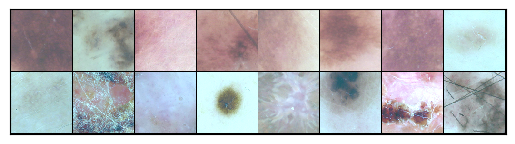

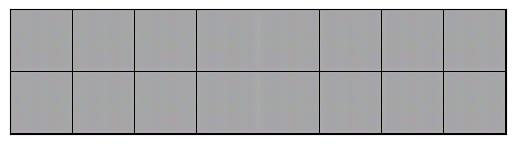

model saved



100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


epoch: 2/50 
72 iterations
recon_error: 20.487
perplexity: 1.000


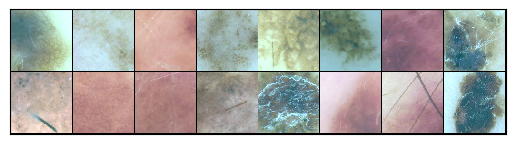

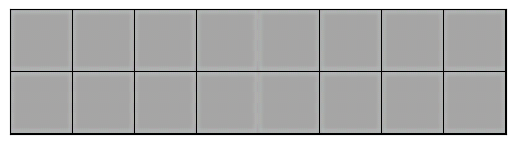

model saved



100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


epoch: 3/50 
108 iterations
recon_error: 20.408
perplexity: 1.000


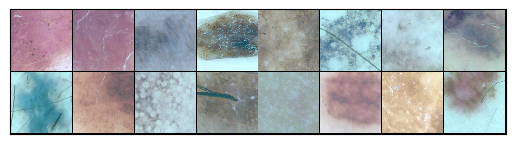

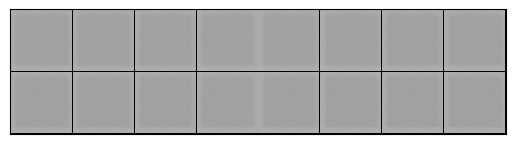

model saved



100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


epoch: 4/50 
144 iterations
recon_error: 20.375
perplexity: 1.000


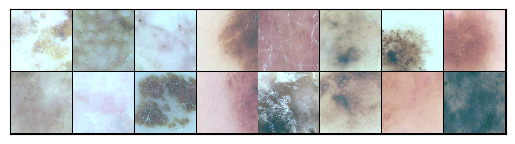

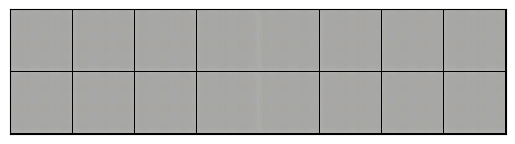

model saved



100%|██████████| 36/36 [01:06<00:00,  1.85s/it]


epoch: 5/50 
180 iterations
recon_error: 20.367
perplexity: 1.000


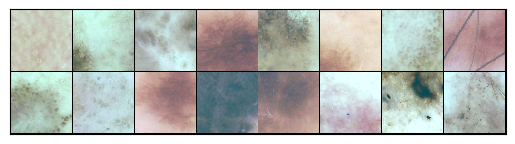

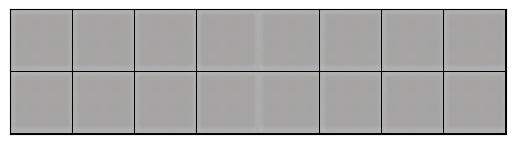

model saved



100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


epoch: 6/50 
216 iterations
recon_error: 20.378
perplexity: 1.000


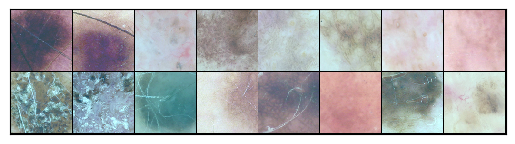

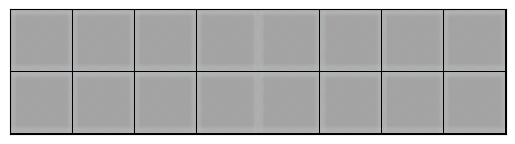

model saved



100%|██████████| 36/36 [01:06<00:00,  1.85s/it]


epoch: 7/50 
252 iterations
recon_error: 20.335
perplexity: 1.000


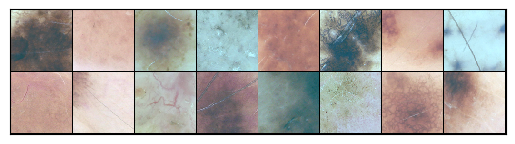

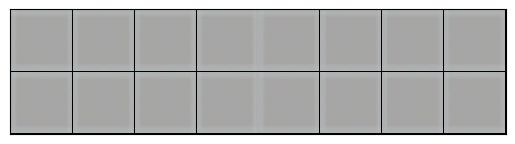

model saved



100%|██████████| 36/36 [01:06<00:00,  1.85s/it]


epoch: 8/50 
288 iterations
recon_error: 20.353
perplexity: 1.000


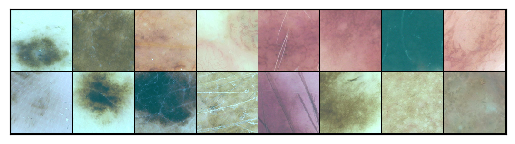

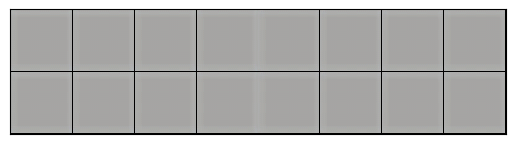

model saved



100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


epoch: 9/50 
324 iterations
recon_error: 21.001
perplexity: 1.002


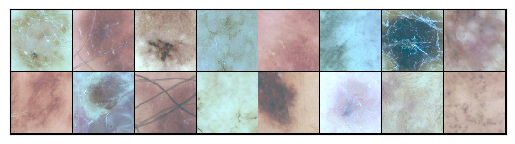

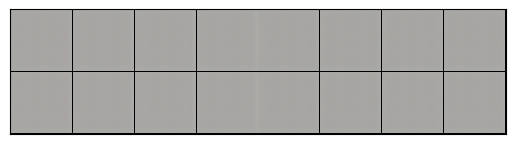

model saved



100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


epoch: 10/50 
360 iterations
recon_error: 20.924
perplexity: 1.002


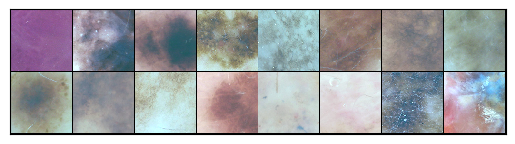

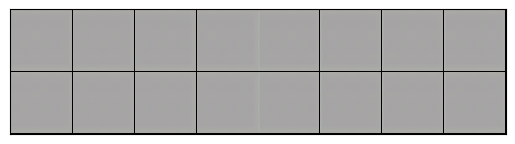

model saved



100%|██████████| 36/36 [01:06<00:00,  1.83s/it]


epoch: 11/50 
396 iterations
recon_error: 20.988
perplexity: 1.002


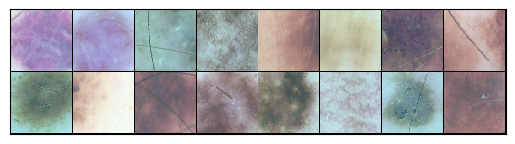

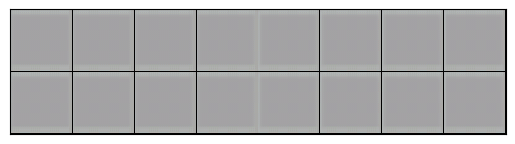

model saved



100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


epoch: 12/50 
432 iterations
recon_error: 20.547
perplexity: 1.108


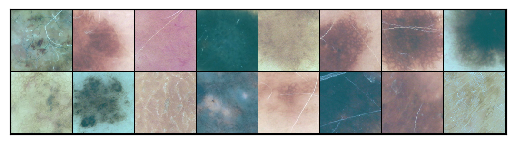

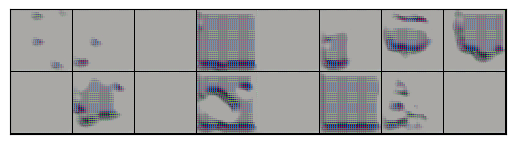

model saved



100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


epoch: 13/50 
468 iterations
recon_error: 19.964
perplexity: 1.333


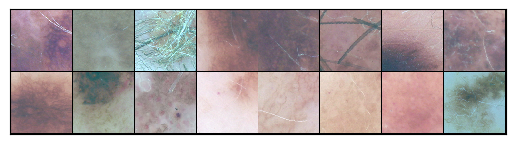

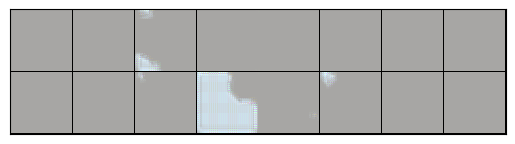

model saved



100%|██████████| 36/36 [01:06<00:00,  1.84s/it]


epoch: 14/50 
504 iterations
recon_error: 17.061
perplexity: 1.586


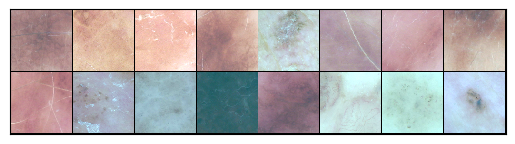

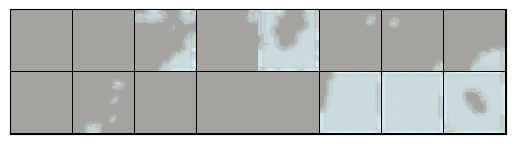

model saved



100%|██████████| 36/36 [01:04<00:00,  1.80s/it]


epoch: 15/50 
540 iterations
recon_error: 13.008
perplexity: 1.709


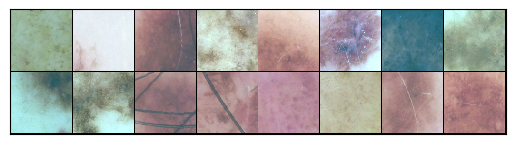

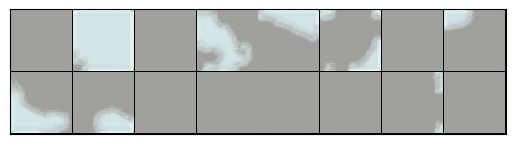

model saved



100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


epoch: 16/50 
576 iterations
recon_error: 11.343
perplexity: 1.718


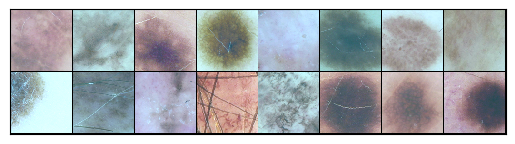

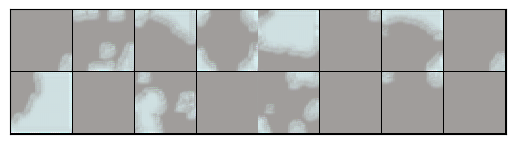

model saved



100%|██████████| 36/36 [01:06<00:00,  1.85s/it]


epoch: 17/50 
612 iterations
recon_error: 10.766
perplexity: 1.711


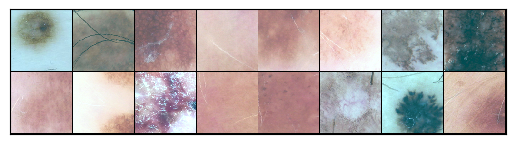

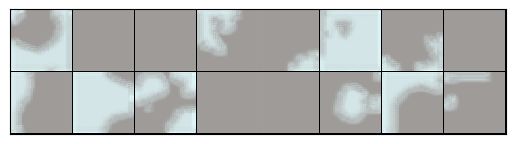

model saved



100%|██████████| 36/36 [01:05<00:00,  1.82s/it]


epoch: 18/50 
648 iterations
recon_error: 10.471
perplexity: 1.748


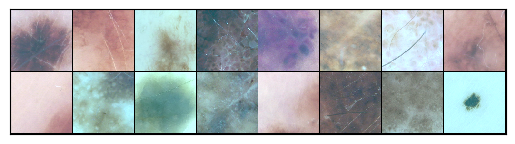

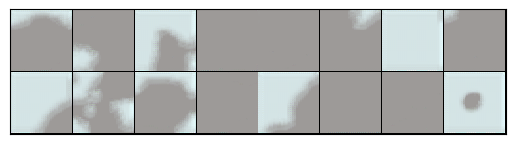

model saved



100%|██████████| 36/36 [01:06<00:00,  1.86s/it]


epoch: 19/50 
684 iterations
recon_error: 9.495
perplexity: 2.587


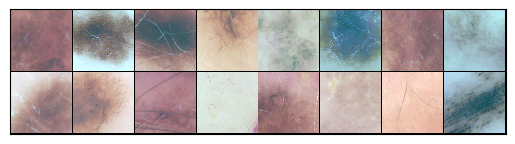

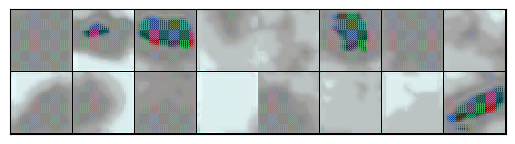

model saved



100%|██████████| 36/36 [01:06<00:00,  1.84s/it]


epoch: 20/50 
720 iterations
recon_error: 7.467
perplexity: 4.047


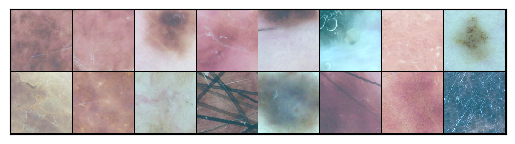

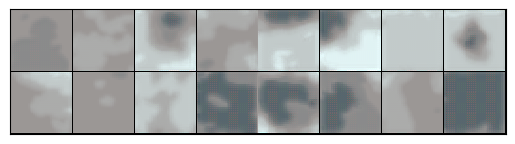

model saved



100%|██████████| 36/36 [01:06<00:00,  1.84s/it]


epoch: 21/50 
756 iterations
recon_error: 5.242
perplexity: 5.576


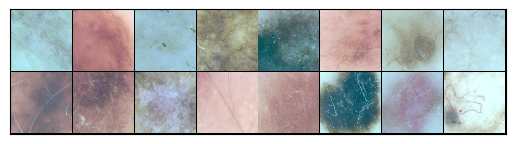

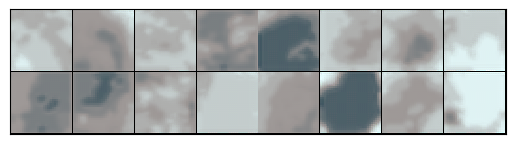

model saved



100%|██████████| 36/36 [01:06<00:00,  1.86s/it]


epoch: 22/50 
792 iterations
recon_error: 3.859
perplexity: 6.758


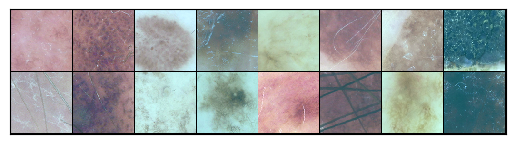

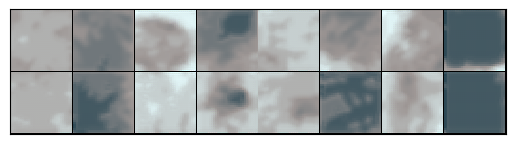

model saved



100%|██████████| 36/36 [01:06<00:00,  1.85s/it]


epoch: 23/50 
828 iterations
recon_error: 3.495
perplexity: 7.875


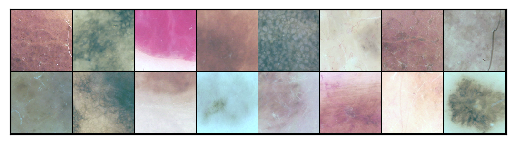

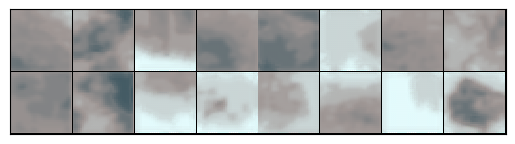

model saved



100%|██████████| 36/36 [01:07<00:00,  1.88s/it]


epoch: 24/50 
864 iterations
recon_error: 3.308
perplexity: 9.117


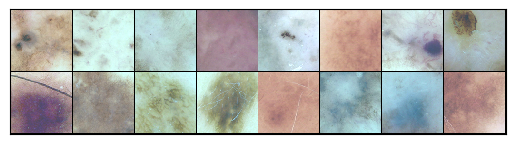

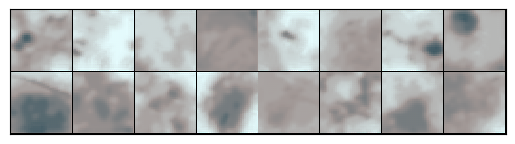

model saved



100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


epoch: 25/50 
900 iterations
recon_error: 3.185
perplexity: 10.322


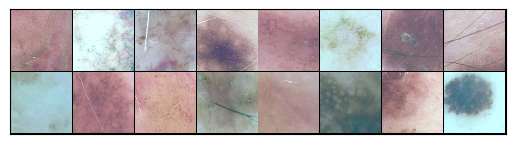

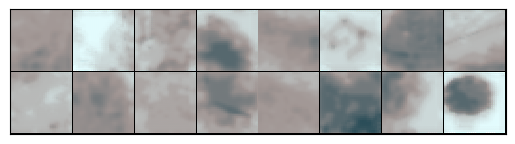

model saved



100%|██████████| 36/36 [01:07<00:00,  1.87s/it]


epoch: 26/50 
936 iterations
recon_error: 3.101
perplexity: 11.332


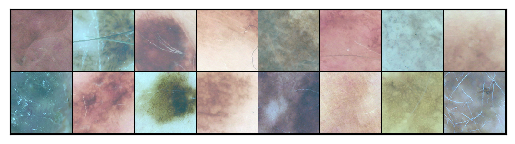

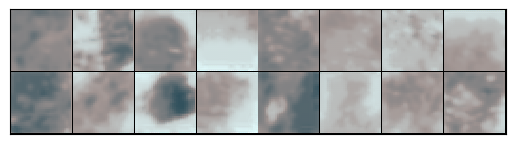

model saved



100%|██████████| 36/36 [01:07<00:00,  1.87s/it]


epoch: 27/50 
972 iterations
recon_error: 3.019
perplexity: 12.172


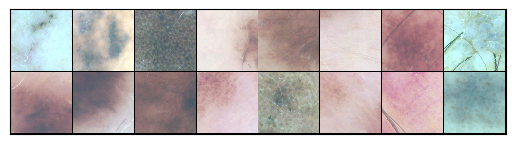

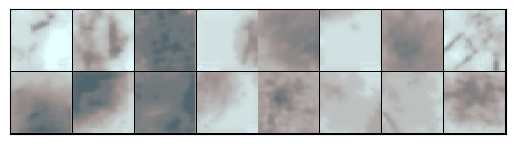

model saved



100%|██████████| 36/36 [01:05<00:00,  1.81s/it]


epoch: 28/50 
1008 iterations
recon_error: 2.938
perplexity: 12.578


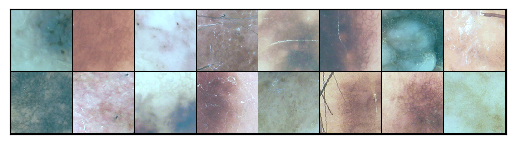

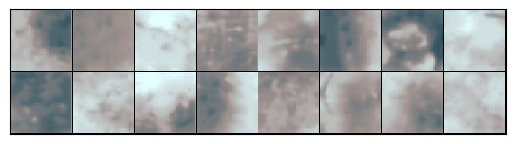

model saved



100%|██████████| 36/36 [01:06<00:00,  1.85s/it]


epoch: 29/50 
1044 iterations
recon_error: 2.868
perplexity: 12.732


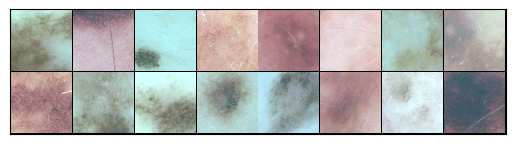

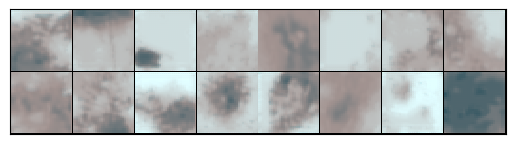

model saved



100%|██████████| 36/36 [01:07<00:00,  1.86s/it]


epoch: 30/50 
1080 iterations
recon_error: 2.871
perplexity: 12.692


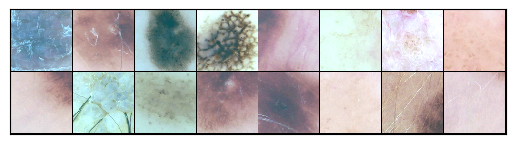

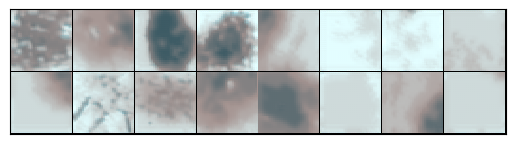

model saved



100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


epoch: 31/50 
1116 iterations
recon_error: 2.847
perplexity: 12.487


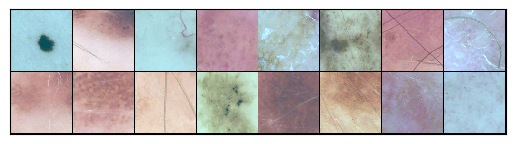

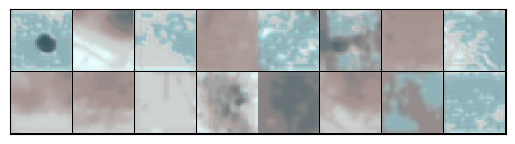

model saved



100%|██████████| 36/36 [01:06<00:00,  1.84s/it]


epoch: 32/50 
1152 iterations
recon_error: 2.843
perplexity: 12.684


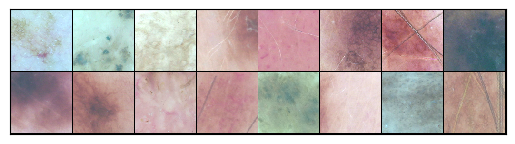

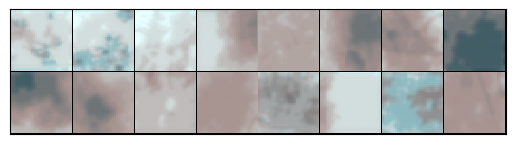

model saved



100%|██████████| 36/36 [01:07<00:00,  1.87s/it]


epoch: 33/50 
1188 iterations
recon_error: 2.709
perplexity: 12.863


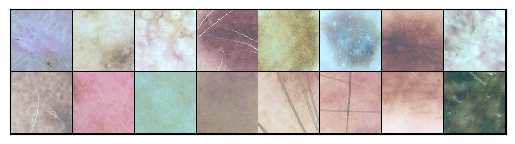

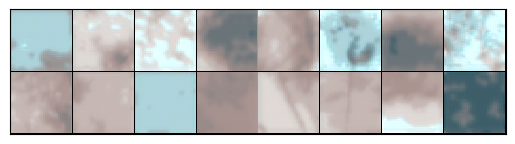

model saved



100%|██████████| 36/36 [01:07<00:00,  1.87s/it]


epoch: 34/50 
1224 iterations
recon_error: 2.532
perplexity: 14.109


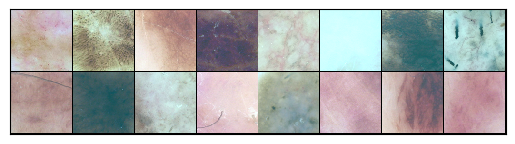

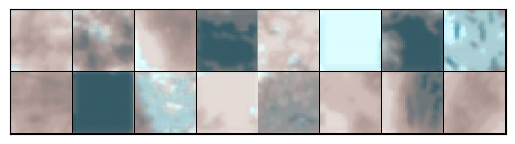

model saved



100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


epoch: 35/50 
1260 iterations
recon_error: 2.395
perplexity: 14.837


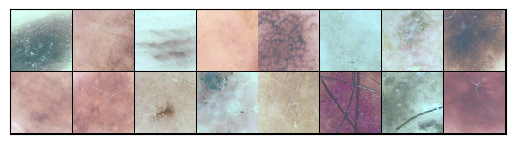

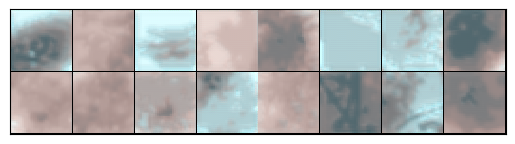

model saved



100%|██████████| 36/36 [01:07<00:00,  1.88s/it]


epoch: 36/50 
1296 iterations
recon_error: 2.421
perplexity: 15.510


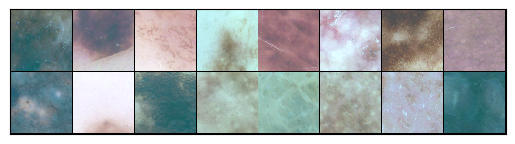

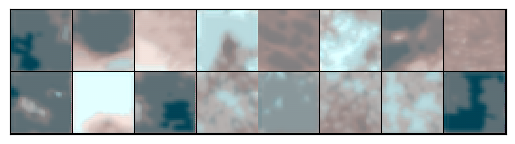

model saved



100%|██████████| 36/36 [01:07<00:00,  1.88s/it]


epoch: 37/50 
1332 iterations
recon_error: 2.390
perplexity: 15.940


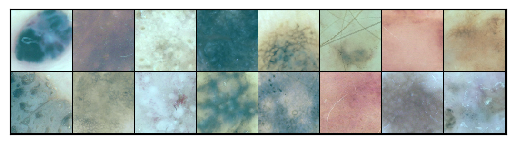

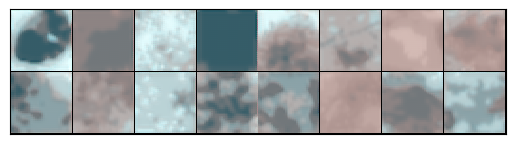

model saved



100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


epoch: 38/50 
1368 iterations
recon_error: 2.304
perplexity: 16.829


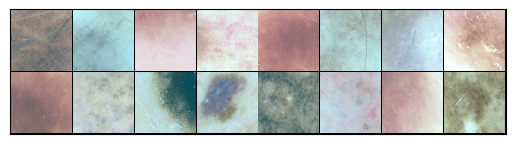

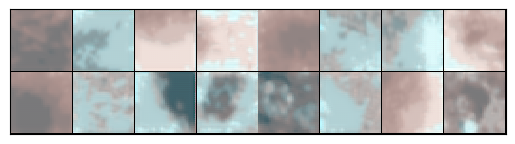

model saved



100%|██████████| 36/36 [01:07<00:00,  1.87s/it]


epoch: 39/50 
1404 iterations
recon_error: 2.096
perplexity: 17.343


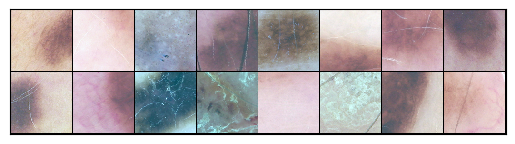

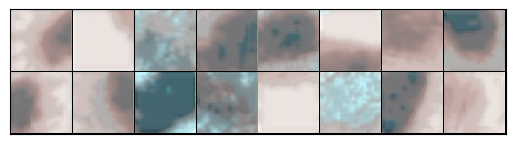

model saved



100%|██████████| 36/36 [01:07<00:00,  1.89s/it]


epoch: 40/50 
1440 iterations
recon_error: 2.030
perplexity: 17.774


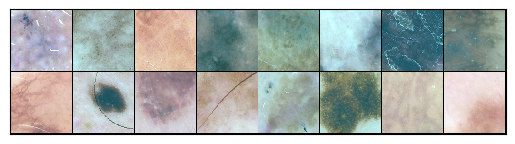

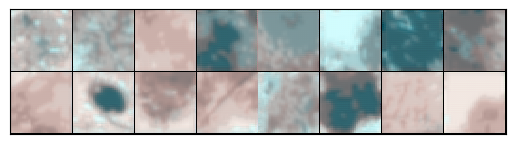

model saved



100%|██████████| 36/36 [01:07<00:00,  1.87s/it]


epoch: 41/50 
1476 iterations
recon_error: 1.973
perplexity: 18.547


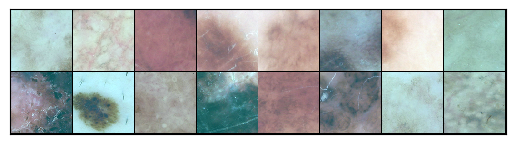

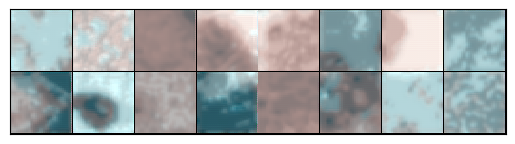

model saved



100%|██████████| 36/36 [01:05<00:00,  1.83s/it]


epoch: 42/50 
1512 iterations
recon_error: 1.856
perplexity: 19.809


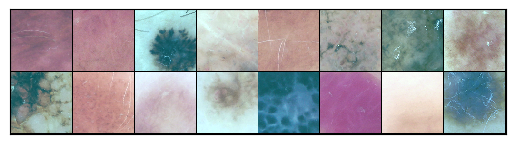

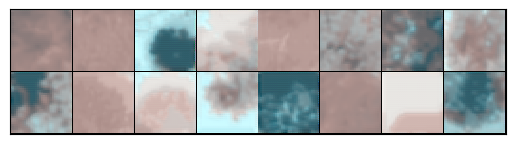

model saved



100%|██████████| 36/36 [01:07<00:00,  1.89s/it]


epoch: 43/50 
1548 iterations
recon_error: 1.735
perplexity: 20.841


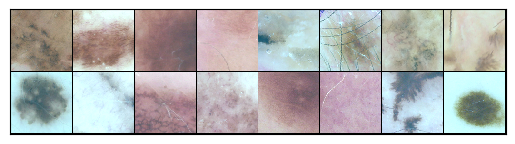

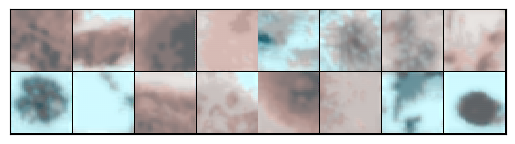

model saved



100%|██████████| 36/36 [01:08<00:00,  1.90s/it]


epoch: 44/50 
1584 iterations
recon_error: 1.620
perplexity: 22.024


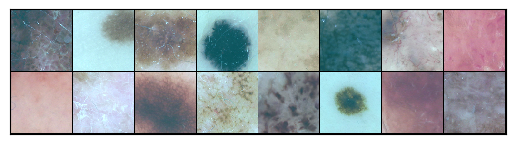

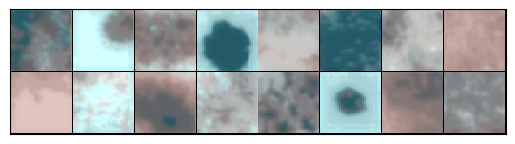

model saved



100%|██████████| 36/36 [01:06<00:00,  1.85s/it]


epoch: 45/50 
1620 iterations
recon_error: 1.492
perplexity: 22.816


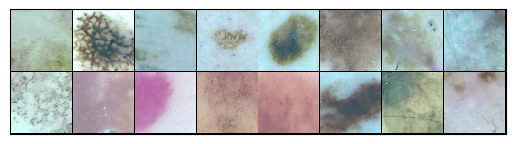

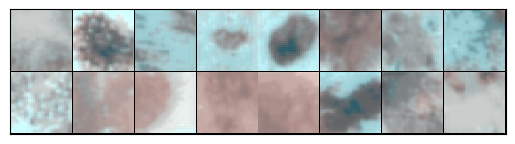

model saved



100%|██████████| 36/36 [01:06<00:00,  1.85s/it]


epoch: 46/50 
1656 iterations
recon_error: 1.425
perplexity: 23.931


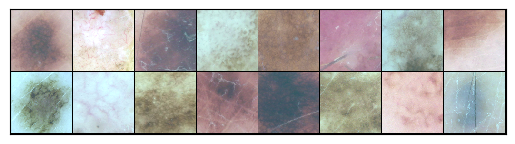

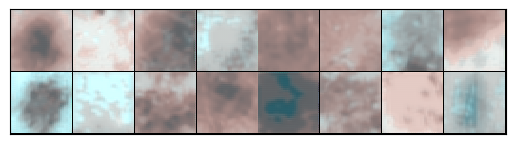

model saved



100%|██████████| 36/36 [01:06<00:00,  1.86s/it]


epoch: 47/50 
1692 iterations
recon_error: 1.363
perplexity: 24.864


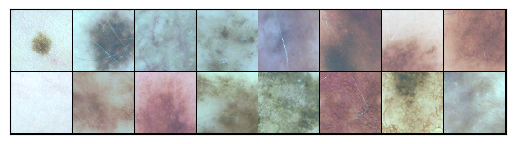

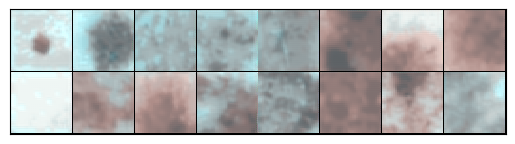

model saved



100%|██████████| 36/36 [01:06<00:00,  1.86s/it]


epoch: 48/50 
1728 iterations
recon_error: 1.312
perplexity: 25.946


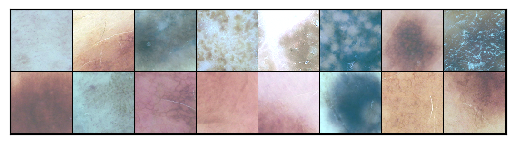

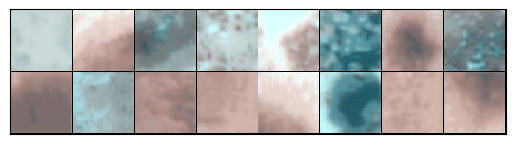

model saved



100%|██████████| 36/36 [01:06<00:00,  1.84s/it]


epoch: 49/50 
1764 iterations
recon_error: 1.256
perplexity: 26.972


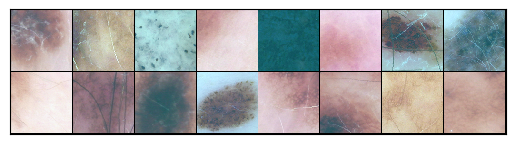

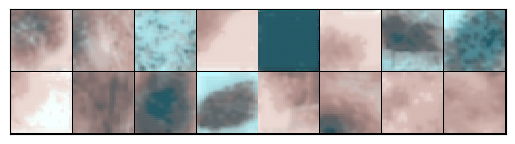

model saved



100%|██████████| 36/36 [01:06<00:00,  1.85s/it]


epoch: 50/50 
1800 iterations
recon_error: 1.231
perplexity: 28.032


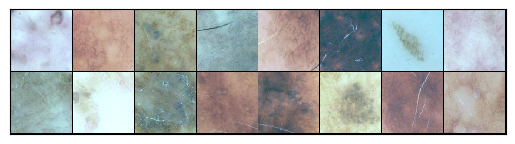

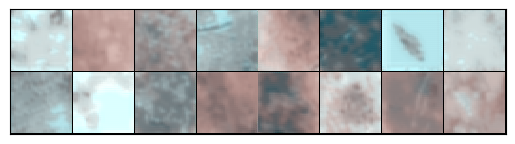

model saved



In [ ]:
model.train()
train_res_recon_error = []
train_res_perplexity = []
epochs = 50
for i in range(epochs):
    for data in tqdm(training_loader):
        data = data.to(device)
        optimizer.zero_grad()

        vq_loss, data_recon, perplexity = model(data)
        recon_error = F.mse_loss(data_recon, data) / data_variance
        loss = recon_error + vq_loss
        loss.backward()

        optimizer.step()

        train_res_recon_error.append(recon_error.item())
        train_res_perplexity.append(perplexity.item())
        # break

        # if (i+1) % 100 == 0:

    print(f'epoch: {i+1}/{epochs} ')
    print('%d iterations' % ((i+1)*len(training_loader)))
    print('recon_error: %.3f' % np.mean(train_res_recon_error[-100:]))
    print('perplexity: %.3f' % np.mean(train_res_perplexity[-100:]))
    show(make_grid(denorm(data[:16].cpu().data,mean,std)))
    plt.show()
    show(make_grid(denorm(data_recon[:16].cpu().data,mean,std)))
    plt.show()

    state_dict = {
        'model': model.state_dict(),
        'epochs':i,
        'recon_error': np.mean(train_res_recon_error[-100:]),
        'perplexity': np.mean(train_res_perplexity[-100:]),
    }
    torch.save(state_dict,'/content/drive/MyDrive/DL_A5/model_vqvae.pth')
    print('model saved')
    print()
    # break


## Plot Loss

In [ ]:
train_res_recon_error_smooth = savgol_filter(train_res_recon_error, 201, 7)
train_res_perplexity_smooth = savgol_filter(train_res_perplexity, 201, 7)

Text(0.5, 0, 'iteration')

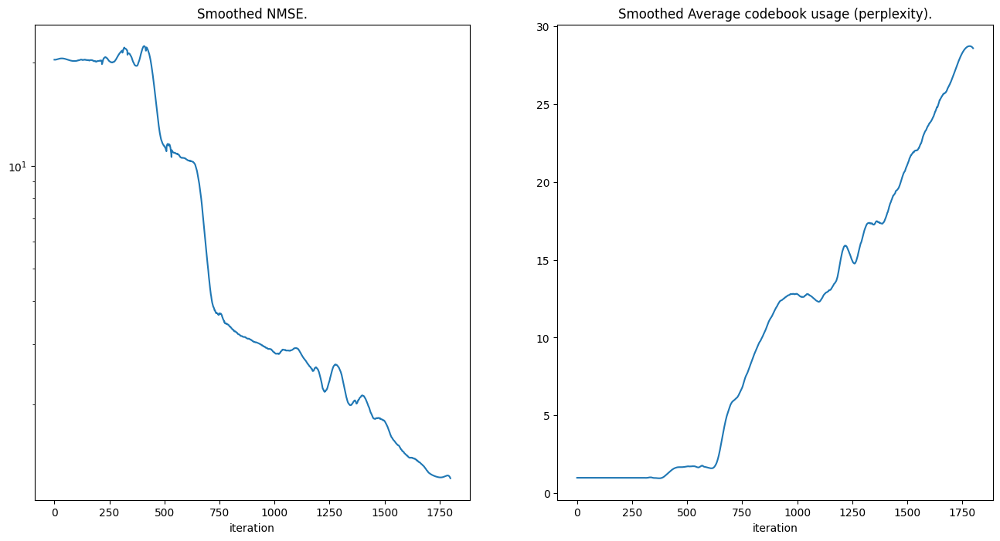

In [ ]:
f = plt.figure(figsize=(16,8))
ax = f.add_subplot(1,2,1)
ax.plot(train_res_recon_error_smooth)
ax.set_yscale('log')
ax.set_title('Smoothed NMSE.')
ax.set_xlabel('iteration')

ax = f.add_subplot(1,2,2)
ax.plot(train_res_perplexity_smooth)
ax.set_title('Smoothed Average codebook usage (perplexity).')
ax.set_xlabel('iteration')

## View Reconstructions

In [ ]:
model.eval()

(valid_originals) = next(iter(validation_loader))
valid_originals = valid_originals.to(device)

vq_output_eval = model._pre_vq_conv(model._encoder(valid_originals))
_, valid_quantize, _, _ = model._vq_vae(vq_output_eval)
valid_reconstructions = model._decoder(valid_quantize)

In [ ]:
(train_originals) = next(iter(training_loader))
train_originals = train_originals.to(device)
_, train_reconstructions, _, _ = model._vq_vae(train_originals)

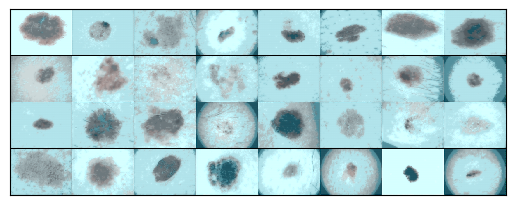

In [ ]:
show(make_grid(denorm(valid_reconstructions.cpu().data,mean,std)))

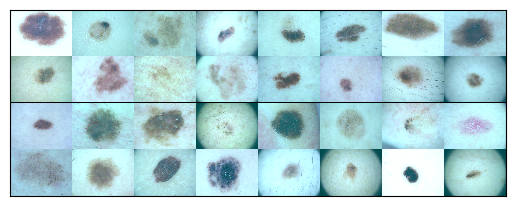

In [ ]:
show(make_grid(denorm(valid_originals.cpu().data,mean,std)))

## View Embedding

In [ ]:
torch.save(model.state_dict(), 'model_vqvae_e50.pth')

In [15]:
# !pip install umap-learn
import umap

In [16]:
proj = umap.UMAP(n_neighbors=3,
                 min_dist=0.1,
                 metric='cosine').fit_transform(model._vq_vae._embedding.weight.data.cpu())

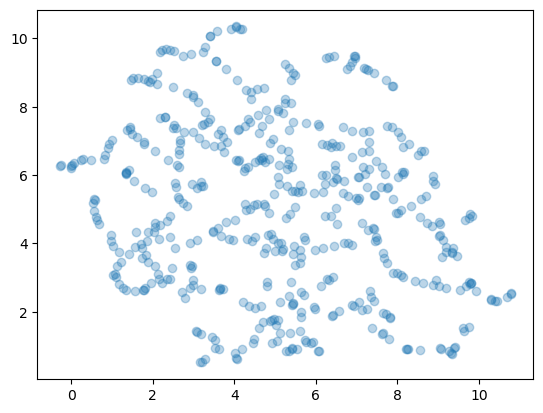

In [17]:
plt.scatter(proj[:,0], proj[:,1], alpha=0.3)

# Model Inference 

16384

In [26]:
model.load_state_dict(torch.load('./model_vqvae.pth')['model'])

<All keys matched successfully>

In [27]:
model(input)

torch.Size([1, 128, 32, 32]) here


(tensor(0.1155, device='cuda:0', grad_fn=<MulBackward0>),
 tensor([[[[ 0.4718,  0.2981,  0.3135,  ...,  0.1460,  0.1456, -0.2393],
           [ 0.3728,  0.5007,  0.4856,  ..., -0.1828, -0.2545,  0.1142],
           [ 0.3949,  0.5547,  0.5931,  ..., -0.1723, -0.2989,  0.2069],
           ...,
           [ 0.3450,  0.0954, -0.0263,  ..., -0.1863, -0.1574, -0.2451],
           [ 0.0086, -0.2587, -0.2127,  ..., -0.2181, -0.0326, -0.3650],
           [-0.1828,  0.0728,  0.0691,  ..., -0.3073, -0.3809,  0.3099]],
 
          [[-0.0437,  0.2316,  0.3791,  ..., -0.0130, -0.0252, -0.3265],
           [ 0.0482,  0.2053,  0.2097,  ..., -0.1876, -0.1481,  0.2908],
           [ 0.0061,  0.3157,  0.2656,  ..., -0.0129, -0.0275,  0.3103],
           ...,
           [-0.2803, -0.1604, -0.1948,  ..., -0.2232, -0.2307, -0.1868],
           [-0.0962, -0.1867, -0.0583,  ..., -0.0707, -0.1009, -0.2324],
           [-0.4840, -0.0794, -0.0228,  ..., -0.3810, -0.5392, -0.1421]],
 
          [[-0.2772,  0.1426

In [19]:
embedding_dim = 128
num_embeddings = 512

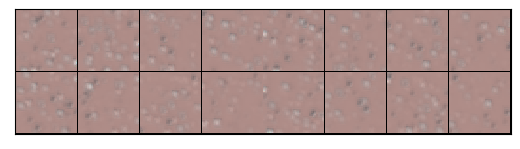

In [52]:
N = 16
input_shape = (N, 32, 32, 128)
z = torch.randint(0, num_embeddings, (N*32*32,)).unsqueeze(1).to(device)
encodings = torch.zeros(z.shape[0], num_embeddings, device=device)
encodings.scatter_(1, z, 1)
# Quantize and unflatten
quantized = torch.matmul(encodings, model._vq_vae._embedding.weight).view(input_shape).permute(0, 3, 1, 2)

x_recon = model._decoder(quantized)
show(make_grid(denorm(x_recon.cpu().data,mean,std)))